# Import Necessary Library

In [1]:
#Importing Libraries
import tensorflow as tf
import numpy as np
import pandas as pd
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
import matplotlib.patches as mpatches
import sys
import warnings
import os
from google.colab import files
import pickle
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

In [2]:
# enables music21 to render images of musical notes
print('installing lilypond...')
!apt-get install lilypond > /dev/null

# converts midi files to wav files into order to play them
print('installing fluidsynth...')
!apt-get install fluidsynth > /dev/null
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2

print('installing musescore...')
!apt install musescore3 > /dev/null

print('done!')

installing lilypond...
Extracting templates from packages: 100%
installing fluidsynth...
Extracting templates from packages: 100%
installing musescore...


done!


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data Gathering & Preprocessing

## Gather, Sampling and Key Transposing

In [4]:
#Loading the list of chopin's midi files as stream
filepath = "/content/drive/MyDrive/ClassicalMusic/chopin/"
#Getting midi files
all_midis= []
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+i
        midi_ut = converter.parse(tr)
        k = midi_ut.analyze('key')
        i = interval.Interval(k.tonic, pitch.Pitch('C'))
        midi_nt = midi_ut.transpose(i)
        midi = midi_nt.stripTies()
        all_midis.append(midi)


Gather all midis file and transpose the key of the all music to middle C

In [5]:
all_midis = all_midis[:5]

Select 5 only chopin music.

## Music Functions

In [6]:
def show(music):
  display(Image(str(music.write('lily.png'))))

def play(music):
  filename = music.write('mid')
  !fluidsynth -ni font.sf2 $filename -F $filename\.wav -r 16000 > /dev/null
  display(Audio(str(filename) + '.wav'))

define two functions to produce a music sheet and music audio

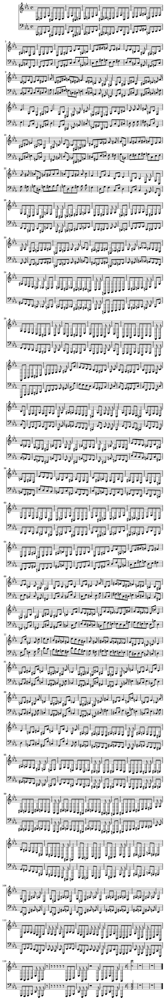

In [7]:
show(all_midis[1])

In [8]:
play(all_midis[1])

## Clef Splitting

In [9]:
def split_part(midis):
  all_midis_parts = []

  for midi in midis:
    for i in range(len(midi.parts)):
      all_midis_parts.append(midi.parts[i])

  return all_midis_parts

In [10]:
all_midi_split = split_part(all_midis)

split the midi file into parts

In [11]:
len(all_midi_split)

11

Each of the music composed of two part which is also means two clef. There are total of 5 midi file, but there are 11 parts in total. One of the files may have more than one bass or treble clef.

In [12]:
def split_clef(midis_parts):
  treble_clef_midi = []
  bass_clef_midi = []

  for midi in midis_parts:
    for element in midi.flat:

      clef_name = None

      if isinstance(element, music21.clef.Clef):
        clef_name = str(element.name)

        if clef_name  == 'treble':
          treble_clef_midi.append(midi)

        elif clef_name == 'bass':
          bass_clef_midi.append(midi)

  return treble_clef_midi, bass_clef_midi


In [13]:
treble_midis, bass_midis = split_clef(all_midi_split)

Each of the part was looked for their clef property, the part with same clef property will be group together, i.e. part with treble clef property belongs to treble clef while part with bass clef property belongs to bass clef.  

In [14]:
treble_midis

[<music21.stream.Part 0x7c1c348c1660>,
 <music21.stream.Part 0x7c1c3290a3e0>,
 <music21.stream.Part 0x7c1c31dcd8a0>,
 <music21.stream.Part 0x7c1c2c8bf310>,
 <music21.stream.Part 0x7c1c2a9a4d00>]

In [15]:
bass_midis

[<music21.stream.Part 0x7c1c348c0dc0>,
 <music21.stream.Part 0x7c1c3290ae00>,
 <music21.stream.Part 0x7c1c31dcc0a0>,
 <music21.stream.Part 0x7c1c2e615990>,
 <music21.stream.Part 0x7c1c2a9a4280>,
 <music21.stream.Part 0x7c1c30457f10>]

## Duplicates

In [16]:
duplicates = [element for element in bass_midis if element in treble_midis]
print(duplicates)

[]


No duplicates data

## Music Element Extraction

In [17]:
def extract_notes_all(midi_clef):

  notes = []
  durations = []
  #types = []
  sequence_num = []

  for midi_part in midi_clef:
    for element in midi_part.flat:
      note_name = None
      duration_name  = None


    #if isinstance(element, music21.key.Key):
    # note_name = str(element.tonic.name) + ':' + str(element.mode)
    #  duration_name = "0.0"

    #elif isinstance(element, music21.meter.TimeSignature):
    #  note_name = str(element.ratioString) + 'TS'
    #  duration_name = "0.0"

      if isinstance(element, music21.chord.Chord):
        note_name = []
        duration_name = []
        for i in element.pitches:
          note_name.append(i.nameWithOctave)
        #note_name = element.pitches[-1].nameWithOctave
        #note_name = element
          #duration_name.append(element.duration.quarterLength)
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Rest):
        note_name = str(element.name)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Note):
        note_name = str(element.nameWithOctave)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      if note_name and duration_name:
        notes.append(note_name)
        durations.append(duration_name)

  return notes, durations

In [18]:
bass_midis_element = extract_notes_all(bass_midis)
treble_midis_element = extract_notes_all(treble_midis)

The music element such as notes, chords and durations will be extracted for each clef. Noted that, each music elements of treble and bass clef are remains separated. The notes and chords are grouped together under the same feature while durations itself become another feature.

In [19]:
bass_midis_element

(['C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'G1',
  'C#3',
  'E3',
  'D3',
  'F3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'G1',
  'C#3',
  'E3',
  'D3',
  'F3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'A1',
  'E-3',
  'F#3',
  'E3',
  'A3',
  'C3',
  'D2',
  'C#3',
  'E3',
  'D3',
  'G3',
  'B2',
  'rest',
  'D2',
  'C#3',
  'E3',
  'D3',
  'F#3',
  'A2',
  'G2',
  'C#3',
  'E3',
  'D3',
  'G3',
  'B2',
  'D3',
  'C3',
  'F3',
  'A2',
  'C3',
  'B2',
  'E3',
  'G2',
  'E3',
  'F2',
  'E3',
  'D3',
  'rest',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'G1',
  'C#3',
  'E3',
  'D3',
  'F3',
  'G2',
  'C2',
  '

In [20]:
len(bass_midis_element[0])

3963

In [21]:
len(bass_midis_element[1])

3963

In [22]:
treble_midis_element

([['G3', 'C4', 'E4'],
  ['C4', 'G3', 'E4'],
  ['G3', 'E4', 'C4'],
  'rest',
  'B3',
  'F4',
  'D4',
  ['C4', 'E4', 'G3'],
  'rest',
  'G3',
  ['C4', 'E4'],
  ['E4', 'C4'],
  'G3',
  ['E4', 'C4'],
  'rest',
  ['F4', 'D4'],
  ['E4', 'C4'],
  'rest',
  ['B3', 'D4'],
  'rest',
  ['E4', 'C4'],
  'rest',
  'B3',
  ['G4', 'E4'],
  'rest',
  ['F4', 'D4'],
  'rest',
  'rest',
  ['D4', 'G3'],
  ['G3', 'C4', 'E4'],
  ['E4', 'G3', 'G4'],
  ['E4', 'C5', 'C4'],
  'rest',
  ['G4', 'B4', 'D4'],
  ['C4', 'D4'],
  'B4',
  'A4',
  ['C4', 'D4'],
  'rest',
  ['B3', 'G4', 'D4'],
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'E3',
  ['C4', 'E4', 'G3'],
  ['G3', 'C4', 'E4'],
  ['C4', 'E4'],
  'G3',
  'rest',
  ['F4', 'B3'],
  'D4',
  ['C4', 'G3', 'E4'],
  'rest',
  ['G3', 'E4'],
  'C4',
  'rest',
  ['G3', 'E4', 'C4'],
  ['C4', 'E4', 'G3'],
  ['G3', 'C4', 'E4'],
  ['

In [23]:
len(treble_midis_element[0])

4435

In [24]:
len(treble_midis_element[1])

4435

## Dataframe Construction

In [25]:
bass_df = pd.DataFrame(bass_midis_element).T
bass_df.columns = ['music_element', 'duration']
bass_df

,music_element,duration
0,C2,0.5
1,B2,0.5
2,D3,0.5
3,C3,0.5
4,E3,0.5
...,...,...
3958,C1,2.0
3959,C2,4.0
3960,rest,1.0
3961,G1,3.0


In [26]:
treble_df = pd.DataFrame(treble_midis_element).T
treble_df.columns = ['music_element', 'duration']
treble_df

,music_element,duration
0,"[G3, C4, E4]",3.0
1,"[C4, G3, E4]",3.0
2,"[G3, E4, C4]",3.0
3,rest,3.0
4,B3,3.0
...,...,...
4430,C4,0.25
4431,C4,1.0
4432,C4,0.75
4433,C4,0.25


There are total two dataframe constructed for each clef. Each dataframe consist of two features. The first feature named as 'music_element' where it consist of notes and chords while second feature named as 'duration' where it consist of duration only.

## Data Transformation

In [27]:
chords_list_tr = []
for i in treble_df['music_element']:
  if type(i) == list:
    chords_list_tr.append(i)

In [28]:
chords_list_tr

[['G3', 'C4', 'E4'],
 ['C4', 'G3', 'E4'],
 ['G3', 'E4', 'C4'],
 ['C4', 'E4', 'G3'],
 ['C4', 'E4'],
 ['E4', 'C4'],
 ['E4', 'C4'],
 ['F4', 'D4'],
 ['E4', 'C4'],
 ['B3', 'D4'],
 ['E4', 'C4'],
 ['G4', 'E4'],
 ['F4', 'D4'],
 ['D4', 'G3'],
 ['G3', 'C4', 'E4'],
 ['E4', 'G3', 'G4'],
 ['E4', 'C5', 'C4'],
 ['G4', 'B4', 'D4'],
 ['C4', 'D4'],
 ['C4', 'D4'],
 ['B3', 'G4', 'D4'],
 ['C4', 'E4', 'G3'],
 ['G3', 'C4', 'E4'],
 ['C4', 'E4'],
 ['F4', 'B3'],
 ['C4', 'G3', 'E4'],
 ['G3', 'E4'],
 ['G3', 'E4', 'C4'],
 ['C4', 'E4', 'G3'],
 ['G3', 'C4', 'E4'],
 ['C4', 'E4', 'G3'],
 ['E4', 'C4', 'G3'],
 ['C4', 'E4'],
 ['D4', 'F4'],
 ['C4', 'E4'],
 ['D4', 'B3'],
 ['E4', 'C4'],
 ['E4', 'G4'],
 ['D4', 'F4'],
 ['G3', 'D4'],
 ['B-3', 'G3', 'E4'],
 ['E4', 'B-3'],
 ['E4', 'B-3', 'G4'],
 ['B-3', 'A4', 'E4'],
 ['G4', 'B-3', 'E4'],
 ['D4', 'F4', 'A3'],
 ['G3', 'C#4', 'E4'],
 ['D4', 'F3', 'F4'],
 ['D4', 'F3'],
 ['E4', 'G3'],
 ['E3', 'C4'],
 ['F4', 'A3'],
 ['F3', 'D4'],
 ['E3', 'C4'],
 ['B3', 'B4'],
 ['A4', 'A3'],
 ['G4', 'G

In [29]:
chords_list_bs = []
for i in bass_df['music_element']:
  if type(i) == list:
    chords_list_bs.append(i)

In [30]:
chords_list_bs

[['A2', 'E3'],
 ['A2', 'E3'],
 ['A2', 'E3'],
 ['A2', 'A3'],
 ['A2', 'E3'],
 ['A2', 'E3'],
 ['A2', 'G3'],
 ['A2', 'F#3'],
 ['A2', 'E3'],
 ['D2', 'E3'],
 ['D2', 'D3'],
 ['D3', 'D2'],
 ['G2', 'D3'],
 ['A2', 'D3'],
 ['G2', 'D3'],
 ['D2', 'D3'],
 ['G2', 'D3'],
 ['A2', 'D3'],
 ['G2', 'D3'],
 ['C3', 'D3'],
 ['B2', 'D3'],
 ['D2', 'D3'],
 ['G2', 'D3'],
 ['G2', 'D3'],
 ['G2', 'D3'],
 ['G2', 'G3'],
 ['G2', 'D3'],
 ['G2', 'D3'],
 ['G2', 'F3'],
 ['G2', 'E3'],
 ['G2', 'D3'],
 ['C2', 'D3'],
 ['C2', 'C3'],
 ['C3', 'C2'],
 ['F2', 'C3'],
 ['G2', 'C3'],
 ['F2', 'C3'],
 ['C2', 'C3'],
 ['F2', 'C3'],
 ['G2', 'C3'],
 ['F2', 'C3'],
 ['C2', 'C3'],
 ['F2', 'C3'],
 ['G2', 'C3'],
 ['A2', 'C3'],
 ['C3', 'A2'],
 ['A2', 'C3'],
 ['A2', 'C3'],
 ['G2', 'C3'],
 ['G2', 'C3'],
 ['F2', 'C3'],
 ['C3', 'F2'],
 ['F2', 'C3'],
 ['F2', 'C3'],
 ['G2', 'C3'],
 ['G2', 'C3'],
 ['A2', 'C3'],
 ['C3', 'A2'],
 ['F2', 'C3'],
 ['F2', 'C3'],
 ['F2', 'D3'],
 ['F2', 'D3'],
 ['F2', 'D3'],
 ['C3', 'F2'],
 ['F2', 'D3'],
 ['F2', 'C3'],
 ['E2', '

In [31]:
unique_chords_tr = list(np.unique(np.array(chords_list_tr, dtype="object")))

In [32]:
chords_dict_tr = dict()
for i in range(len((unique_chords_tr))):
  if type(unique_chords_tr[i]) == list:
    chords_dict_tr[str('CH') + str(i)] =unique_chords_tr[i]

In [33]:
chords_dict_tr

{'CH0': ['A3', 'A4'],
 'CH1': ['A3', 'C4'],
 'CH2': ['A3', 'D4'],
 'CH3': ['A3', 'D4', 'F3'],
 'CH4': ['A3', 'E4'],
 'CH5': ['A3', 'F4'],
 'CH6': ['A3', 'F4', 'D4'],
 'CH7': ['A4', 'A3'],
 'CH8': ['A4', 'B-3', 'C5', 'E4'],
 'CH9': ['A4', 'B5'],
 'CH10': ['A4', 'C4'],
 'CH11': ['A4', 'C5'],
 'CH12': ['A4', 'F#4'],
 'CH13': ['A5', 'C5'],
 'CH14': ['A5', 'G#5'],
 'CH15': ['B-3', 'A4', 'E4'],
 'CH16': ['B-3', 'D4'],
 'CH17': ['B-3', 'G3', 'E4'],
 'CH18': ['B-3', 'G4'],
 'CH19': ['B-4', 'A4'],
 'CH20': ['B-4', 'C#5'],
 'CH21': ['B-4', 'D5'],
 'CH22': ['B-4', 'G5'],
 'CH23': ['B-5', 'D5'],
 'CH24': ['B3', 'B4'],
 'CH25': ['B3', 'D4'],
 'CH26': ['B3', 'F3', 'D4'],
 'CH27': ['B3', 'F3', 'F4'],
 'CH28': ['B3', 'G4'],
 'CH29': ['B3', 'G4', 'D4'],
 'CH30': ['B3', 'G4', 'F3'],
 'CH31': ['B4', 'B-4'],
 'CH32': ['B4', 'D4'],
 'CH33': ['B4', 'D5'],
 'CH34': ['B4', 'F4'],
 'CH35': ['B4', 'F4', 'D5'],
 'CH36': ['B4', 'G4'],
 'CH37': ['B4', 'G4', 'D4', 'B3'],
 'CH38': ['B5', 'A5'],
 'CH39': ['B5', 'G5',

In [34]:
unique_chords_bs = list(np.unique(np.array(chords_list_bs, dtype="object")))

In [35]:
chords_dict_bs = dict()
for i in range(len((unique_chords_bs))):
  if type(unique_chords_bs[i]) == list:
    chords_dict_bs[str('CH') + str(i)] =unique_chords_bs[i]

In [36]:
chords_dict_bs

{'CH0': ['A-0', 'A-1'],
 'CH1': ['A-1', 'A-2'],
 'CH2': ['A-3', 'E-3'],
 'CH3': ['A1', 'G1', 'A1', 'G1', 'A1'],
 'CH4': ['A2', 'A3'],
 'CH5': ['A2', 'C3'],
 'CH6': ['A2', 'D3'],
 'CH7': ['A2', 'D3', 'F#3'],
 'CH8': ['A2', 'E-3'],
 'CH9': ['A2', 'E3'],
 'CH10': ['A2', 'F#3'],
 'CH11': ['A2', 'F#3', 'D3'],
 'CH12': ['A2', 'F3'],
 'CH13': ['A2', 'G3'],
 'CH14': ['A2', 'G3', 'E3'],
 'CH15': ['A3', 'C3'],
 'CH16': ['A3', 'C3', 'E-3'],
 'CH17': ['A3', 'C4'],
 'CH18': ['A3', 'C4', 'D3'],
 'CH19': ['A3', 'D3'],
 'CH20': ['A3', 'D3', 'A2'],
 'CH21': ['A3', 'D3', 'C4'],
 'CH22': ['A3', 'E-3', 'C3'],
 'CH23': ['A3', 'F#3', 'D3', 'C3'],
 'CH24': ['A3', 'F3'],
 'CH25': ['A3', 'F3', 'D3'],
 'CH26': ['A3', 'G3', 'C#3'],
 'CH27': ['B-0', 'B-1'],
 'CH28': ['B-1', 'B1', 'C2', 'B1', 'C2'],
 'CH29': ['B-1', 'G#2'],
 'CH30': ['B-2', 'C3', 'G3'],
 'CH31': ['B-2', 'D2'],
 'CH32': ['B-2', 'D3', 'G3'],
 'CH33': ['B-2', 'E-3'],
 'CH34': ['B-2', 'F3'],
 'CH35': ['B-3', 'C#3'],
 'CH36': ['B-3', 'C3'],
 'CH37': ['

In [37]:
unique_duration_tr = list(np.unique(np.array(treble_df['duration'])))

In [38]:
duration_dict_tr = dict()
for i in range(len((unique_duration_tr))):
    duration_dict_tr[str('DR') + str(i)] =unique_duration_tr[i]

In [39]:
duration_dict_tr

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.4166666666666667,
 'DR5': 0.5,
 'DR6': 0.5833333333333334,
 'DR7': 0.6666666666666666,
 'DR8': 0.75,
 'DR9': 1.0,
 'DR10': 1.25,
 'DR11': 1.3333333333333333,
 'DR12': 1.5,
 'DR13': 2.0,
 'DR14': 2.25,
 'DR15': 2.5,
 'DR16': 2.6666666666666665,
 'DR17': 2.75,
 'DR18': 3.0,
 'DR19': 3.5,
 'DR20': 4.0,
 'DR21': 5.25,
 'DR22': 5.5,
 'DR23': 5.75,
 'DR24': 6.0}

In [40]:
unique_duration_bs = list(np.unique(np.array(bass_df['duration'])))

In [41]:
duration_dict_bs = dict()
for i in range(len((unique_duration_bs))):
    duration_dict_bs[str('DR') + str(i)] =unique_duration_bs[i]

In [42]:
duration_dict_bs

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.5,
 'DR5': 0.5833333333333334,
 'DR6': 0.6666666666666666,
 'DR7': 0.75,
 'DR8': 1.0,
 'DR9': 1.25,
 'DR10': 1.5,
 'DR11': 1.6666666666666667,
 'DR12': 2.0,
 'DR13': 2.3333333333333335,
 'DR14': 2.5,
 'DR15': 2.6666666666666665,
 'DR16': 3.0,
 'DR17': 3.3333333333333335,
 'DR18': 4.0,
 'DR19': 6.0}

In [43]:
for chord_str, chord_note_lst in chords_dict_tr.items():
  treble_df['music_element'] = treble_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

for chord_str, chord_note_lst in chords_dict_bs.items():
  bass_df['music_element'] = bass_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

In [44]:
for duration_str, duration_lst in duration_dict_tr.items():
  treble_df['duration'] = treble_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

for duration_str, duration_lst in duration_dict_bs.items():
  bass_df['duration'] = bass_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

Transform both dataframe where list of chords were changed to chords label and numerical representation of duration data was transformed to categorical data.

## Label Encoding

In [45]:
label_encoder_chord_tr = preprocessing.LabelEncoder()

label_encoder_chord_tr.fit_transform(treble_df['music_element'])
treble_df['music_element']= label_encoder_chord_tr.transform(treble_df['music_element'])

label_encoder_chord_bs = preprocessing.LabelEncoder()

label_encoder_chord_bs.fit_transform(bass_df['music_element'])
bass_df['music_element']= label_encoder_chord_bs.transform(bass_df['music_element'])

In [46]:
label_encoder_duration_tr = preprocessing.LabelEncoder()

label_encoder_duration_tr.fit_transform(treble_df['duration'])
treble_df['duration']= label_encoder_duration_tr.transform(treble_df['duration'])

label_encoder_duration_bs = preprocessing.LabelEncoder()

label_encoder_duration_bs.fit_transform(bass_df['duration'])
bass_df['duration']= label_encoder_duration_bs.transform(bass_df['duration'])

In [47]:
treble_df

,music_element,duration
0,58,10
1,112,10
2,62,10
3,206,10
4,13,10
...,...,...
4430,23,12
4431,23,24
4432,23,23
4433,23,12


In [48]:
bass_df

,music_element,duration
0,19,14
1,12,14
2,272,14
3,20,14
4,282,14
...,...,...
3958,18,4
3959,19,10
3960,301,18
3961,296,8


Change the whole dataframe catergorical data to numerical data by using label encoding.

In [49]:
train_notes_treble = treble_df.to_numpy()
train_notes_bass = bass_df.to_numpy()

In [50]:
train_notes_treble

array([[ 58,  10],
       [112,  10],
       [ 62,  10],
       ...,
       [ 23,  23],
       [ 23,  12],
       [ 23,   5]])

In [51]:
train_notes_bass

array([[ 19,  14],
       [ 12,  14],
       [272,  14],
       ...,
       [301,  18],
       [296,   8],
       [ 18,   4]])

convert the dataframe to numpy array.

## Dataset construction

In [52]:
notes_ds_tr = tf.data.Dataset.from_tensor_slices(train_notes_treble)
notes_ds_bs = tf.data.Dataset.from_tensor_slices(train_notes_bass)

In [53]:
notes_ds_tr.element_spec

TensorSpec(shape=(2,), dtype=tf.int64, name=None)

In [54]:
notes_ds_bs.element_spec

TensorSpec(shape=(2,), dtype=tf.int64, name=None)

In [55]:
key_order = ['music_element', 'duration']
def create_sequences(
    dataset: tf.data.Dataset,
    seq_length: int,
    vocab_size_note = 0,
    vocab_size_duration = 0,
) -> tf.data.Dataset:

  seq_length = seq_length+1


  windows = dataset.window(seq_length, shift=1, stride=1,
                              drop_remainder=True)


  flatten = lambda x: x.batch(seq_length, drop_remainder=True)
  sequences = windows.flat_map(flatten)


  def scale_pitch(x):
    x = x/[vocab_size_note,vocab_size_duration]
    return x


  def split_labels(sequences):
    inputs = sequences[:-1]
    labels_dense = sequences[-1]
    labels = {key:labels_dense[i] for i,key in enumerate(key_order)}

    return scale_pitch(inputs), labels

  return sequences.map(split_labels, num_parallel_calls=tf.data.AUTOTUNE)

In [56]:
num_notes_tr = len(np.unique(list(treble_df['music_element'])))

In [57]:
num_notes_tr

207

In [58]:
num_notes_bs = len(np.unique(list(bass_df['music_element'])))

In [59]:
num_notes_bs

302

In [60]:
duration_tr = len(np.unique(list(treble_df['duration'])))

In [61]:
duration_tr

25

In [62]:
duration_bs = len(np.unique(list(bass_df['duration'])))

In [63]:
duration_bs

20

In [64]:
seq_length = 100

In [65]:
vocab_size_note_tr = num_notes_tr
vocab_size_duration_tr = duration_tr
seq_ds_tr = create_sequences(notes_ds_tr, seq_length, vocab_size_note_tr, vocab_size_duration_tr)
seq_ds_tr.element_spec

(TensorSpec(shape=(100, 2), dtype=tf.float64, name=None),
 {'music_element': TensorSpec(shape=(), dtype=tf.int64, name=None),
  'duration': TensorSpec(shape=(), dtype=tf.int64, name=None)})

In [66]:
vocab_size_note_bs = num_notes_bs
vocab_size_duration_bs = duration_bs
seq_ds_bs = create_sequences(notes_ds_bs, seq_length, vocab_size_note_bs, vocab_size_duration_bs)
seq_ds_bs.element_spec

(TensorSpec(shape=(100, 2), dtype=tf.float64, name=None),
 {'music_element': TensorSpec(shape=(), dtype=tf.int64, name=None),
  'duration': TensorSpec(shape=(), dtype=tf.int64, name=None)})

In [67]:
batch_size = 64

In [68]:
train_ds_tr = (seq_ds_tr
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [69]:
train_ds_tr.element_spec

(TensorSpec(shape=(64, 100, 2), dtype=tf.float64, name=None),
 {'music_element': TensorSpec(shape=(64,), dtype=tf.int64, name=None),
  'duration': TensorSpec(shape=(64,), dtype=tf.int64, name=None)})

In [70]:
train_ds_bs = (seq_ds_bs
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [71]:
train_ds_bs.element_spec

(TensorSpec(shape=(64, 100, 2), dtype=tf.float64, name=None),
 {'music_element': TensorSpec(shape=(64,), dtype=tf.int64, name=None),
  'duration': TensorSpec(shape=(64,), dtype=tf.int64, name=None)})

Total two dataset is constructed for treble and bass clef by by extacting the 100 sequence data with batch size of 64. The dataset was created using dataset tensor from tensor flow library

# Modelling - LSTM

## Model Architecture - Treble

In [72]:
input_shape = (seq_length, 2)
learning_rate = 0.005
temp = 0.3

inputs = tf.keras.Input(input_shape)
x1 = tf.keras.layers.LSTM(512, return_sequences=True)(inputs)
x2= tf.keras.layers.Dropout(0.3)(x1)
x3 = tf.keras.layers.LSTM(256, return_sequences=True)(x2)
x4 = tf.keras.layers.Dropout(0.3)(x3)
x5 = tf.keras.layers.LSTM(256)(x4)
x6 = tf.keras.layers.Dense(256)(x5)
x7 = tf.keras.layers.Dropout(0.3)(x6)
x8 = tf.keras.layers.Lambda(lambda x: x / temp)(x7)

outputs = {
  'music_element': tf.keras.layers.Dense(vocab_size_note_tr, name='music_element', activation = 'softmax' )(x8),
  'duration': tf.keras.layers.Dense(vocab_size_duration_tr, name='duration', activation = 'softmax')(x8),
}

lstm_tr = tf.keras.Model(inputs, outputs)

loss = {
      'music_element': tf.keras.losses.SparseCategoricalCrossentropy(),
      'duration': tf.keras.losses.SparseCategoricalCrossentropy(),
}

#optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

lstm_tr.compile(loss=loss, optimizer='rmsprop')

lstm_tr.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 100, 2)]             0         []                            
                                                                                                  
 lstm (LSTM)                 (None, 100, 512)             1054720   ['input_1[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 100, 512)             0         ['lstm[0][0]']                
                                                                                                  
 lstm_1 (LSTM)               (None, 100, 256)             787456    ['dropout[0][0]']             
                                                                                              

## Model Architecture - Bass

In [73]:
input_shape = (seq_length, 2)
learning_rate = 0.005
temp = 0.3

inputs = tf.keras.Input(input_shape)
x1 = tf.keras.layers.LSTM(512, return_sequences=True)(inputs)
x2= tf.keras.layers.Dropout(0.3)(x1)
x3 = tf.keras.layers.LSTM(256, return_sequences=True)(x2)
x4 = tf.keras.layers.Dropout(0.3)(x3)
x5 = tf.keras.layers.LSTM(256)(x4)
x6 = tf.keras.layers.Dense(256)(x5)
x7 = tf.keras.layers.Dropout(0.3)(x6)
x8 = tf.keras.layers.Lambda(lambda x: x / temp)(x7)

outputs = {
  'music_element': tf.keras.layers.Dense(vocab_size_note_bs, name='music_element', activation = 'softmax' )(x8),
  'duration': tf.keras.layers.Dense(vocab_size_duration_bs, name='duration', activation = 'softmax')(x8),
}

lstm_bs = tf.keras.Model(inputs, outputs)

loss = {
      'music_element': tf.keras.losses.SparseCategoricalCrossentropy(),
      'duration': tf.keras.losses.SparseCategoricalCrossentropy(),
}

#optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

lstm_bs.compile(loss=loss, optimizer='rmsprop')

lstm_bs.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 100, 2)]             0         []                            
                                                                                                  
 lstm_3 (LSTM)               (None, 100, 512)             1054720   ['input_2[0][0]']             
                                                                                                  
 dropout_3 (Dropout)         (None, 100, 512)             0         ['lstm_3[0][0]']              
                                                                                                  
 lstm_4 (LSTM)               (None, 100, 256)             787456    ['dropout_3[0][0]']           
                                                                                            

## Model training - Treble

In [74]:
losses_tr = lstm_tr.evaluate(train_ds_tr, return_dict=True)
losses_tr

67/67 [==============================] - 65s 941ms/step - loss: 8.5062 - duration_loss: 3.1705 - music_element_loss: 5.3357


{'loss': 8.50622844696045,
 'duration_loss': 3.170520782470703,
 'music_element_loss': 5.335709095001221}

In [76]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=5,
        verbose=1,
        restore_best_weights=True),
]

In [77]:
%%time
epochs = 25

train_history_tr = lstm_tr.fit(
    train_ds_tr,
    epochs=epochs,
    batch_size = 64,
    callbacks=callbacks,
)

Epoch 1/25
67/67 [==============================] - 227s 3s/step - loss: 5.7550 - duration_loss: 1.6053 - music_element_loss: 4.1497
Epoch 2/25
67/67 [==============================] - 223s 3s/step - loss: 5.1520 - duration_loss: 1.3993 - music_element_loss: 3.7527
Epoch 3/25
67/67 [==============================] - 222s 3s/step - loss: 5.1506 - duration_loss: 1.4467 - music_element_loss: 3.7040
Epoch 4/25
67/67 [==============================] - 224s 3s/step - loss: 5.5106 - duration_loss: 1.6441 - music_element_loss: 3.8665
Epoch 5/25
67/67 [==============================] - 222s 3s/step - loss: 4.8999 - duration_loss: 1.2800 - music_element_loss: 3.6199
Epoch 6/25
67/67 [==============================] - 223s 3s/step - loss: 5.1413 - duration_loss: 1.3583 - music_element_loss: 3.7829
Epoch 7/25
67/67 [==============================] - 224s 3s/step - loss: 4.9598 - duration_loss: 1.3307 - music_element_loss: 3.6291
Epoch 8/25
67/67 [==============================] - 222s 3s/step - lo

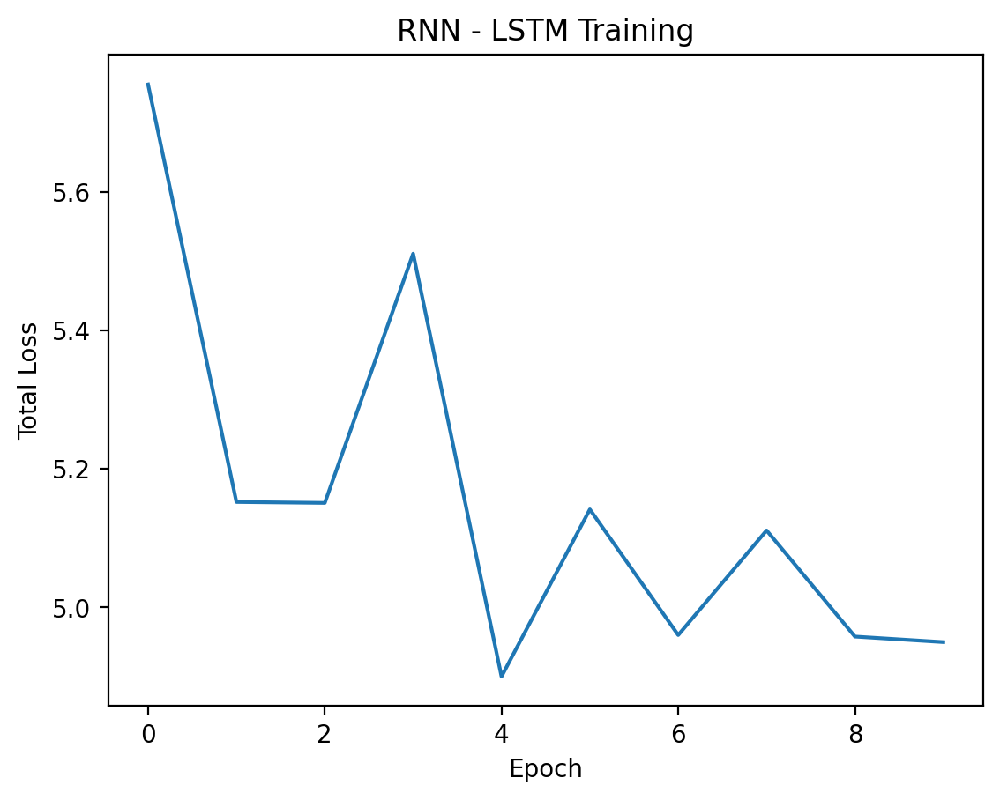

In [78]:
plt.plot(train_history_tr.epoch, train_history_tr.history['loss'], label='total loss')
plt.title('RNN - LSTM Training')
plt.xlabel('Epoch')
plt.ylabel('Total Loss')
plt.show()

## Model training - Bass

In [79]:
train_ds_bs

<_PrefetchDataset element_spec=(TensorSpec(shape=(64, 100, 2), dtype=tf.float64, name=None), {'music_element': TensorSpec(shape=(64,), dtype=tf.int64, name=None), 'duration': TensorSpec(shape=(64,), dtype=tf.int64, name=None)})>

In [75]:
losses_bs = lstm_bs.evaluate(train_ds_bs, return_dict=True)
losses_bs

60/60 [==============================] - 58s 924ms/step - loss: 8.7132 - duration_loss: 3.0171 - music_element_loss: 5.6961


{'loss': 8.713193893432617,
 'duration_loss': 3.017139434814453,
 'music_element_loss': 5.6960554122924805}

In [80]:
%%time
epochs = 25

train_history_bs = lstm_bs.fit(
    train_ds_bs,
    epochs=epochs,
    batch_size = 64,
    callbacks=callbacks,
)

Epoch 1/25
60/60 [==============================] - 208s 3s/step - loss: 6.6910 - duration_loss: 2.2372 - music_element_loss: 4.4538
Epoch 2/25
60/60 [==============================] - 201s 3s/step - loss: 5.4160 - duration_loss: 1.5614 - music_element_loss: 3.8546
Epoch 3/25
60/60 [==============================] - 200s 3s/step - loss: 5.2561 - duration_loss: 1.4944 - music_element_loss: 3.7617
Epoch 4/25
60/60 [==============================] - 202s 3s/step - loss: 5.1587 - duration_loss: 1.4694 - music_element_loss: 3.6893
Epoch 5/25
60/60 [==============================] - 201s 3s/step - loss: 5.1048 - duration_loss: 1.4519 - music_element_loss: 3.6529
Epoch 6/25
60/60 [==============================] - 203s 3s/step - loss: 5.0927 - duration_loss: 1.4429 - music_element_loss: 3.6498
Epoch 7/25
60/60 [==============================] - 201s 3s/step - loss: 5.0874 - duration_loss: 1.4666 - music_element_loss: 3.6208
Epoch 8/25
60/60 [==============================] - 202s 3s/step - lo

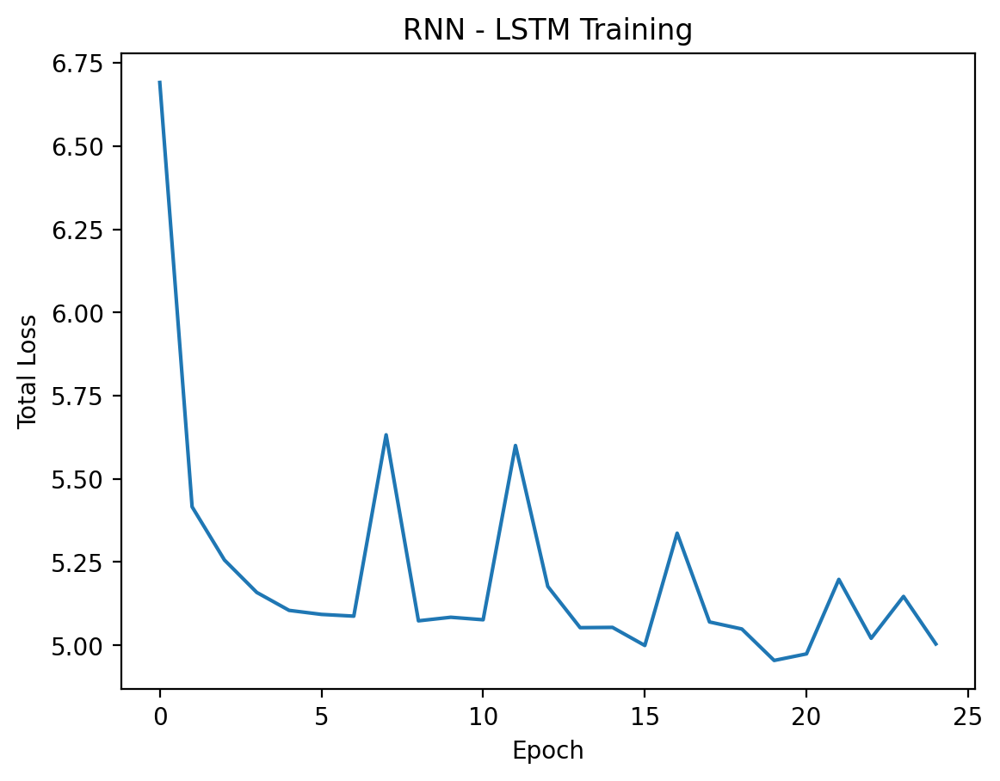

In [81]:
plt.plot(train_history_bs.epoch, train_history_bs.history['loss'], label='total loss')
plt.title('RNN - LSTM Training')
plt.xlabel('Epoch')
plt.ylabel('Total Loss')
plt.show()

# Music Generation

In [82]:
def predict_next_note(notes, model: tf.keras.Model, num_notes = 0, num_duration = 0) -> tuple[int, float]:

  inputs = tf.expand_dims(notes, 0)

  predictions = model.predict(inputs)
  element = predictions['music_element']
  duration = predictions['duration']
  p_element, i_element = tf.math.top_k(element,k=10)
  p_duration, i_duration = tf.math.top_k(duration,k=5)

  p_element /= p_element.numpy().sum()

  i_element = tf.squeeze(i_element, axis=0)
  p_element = tf.squeeze(p_element, axis=0)
  p_element = p_element.numpy()


  p_duration /= p_duration.numpy().sum()

  i_duration = tf.squeeze(i_duration, axis=0)
  p_duration = tf.squeeze(p_duration, axis=0)
  p_duration = p_duration.numpy()

  p_element[-1] = 1 - np.sum(p_element[0:-1])

  element = np.random.choice(i_element, 1, p=p_element )

  p_duration[-1] = 1 - np.sum(p_duration[0:-1])
  duration = np.random.choice(i_duration, 1, p=p_duration )

  return element, duration

Function above is for top k sampling.

In [83]:
def generate_note_df(num_prediction, start_point, input_notes_df, model, vocab_size_note, vocab_size_duration):

  sample_notes = np.stack([input_notes_df[key] for key in key_order], axis=1)
  input_notes = (sample_notes[start_point:seq_length+start_point] / np.array([vocab_size_note,vocab_size_duration]))
  models = model

  generated_notes = input_notes


  for i in range(num_prediction):
    element, duration = predict_next_note(input_notes, models, vocab_size_note,
                    vocab_size_duration)
    input_note = np.append(element, duration)
    generated_notes = np.append(generated_notes, np.expand_dims(input_note, 0)/np.array([vocab_size_note,vocab_size_duration]), axis = 0)
    input_notes = np.delete(input_notes, 0, axis=0)
    input_notes = np.append(input_notes, np.expand_dims(input_note, 0)/np.array([vocab_size_note,vocab_size_duration]), axis=0)

  generated_notes = pd.DataFrame(generated_notes, columns=(key_order))
  return generated_notes

A function above is for notes and durations prediction.

## Music Elements Prediction - Treble

In [84]:
start_ts = 0
generated_note_tr = generate_note_df(100, start_ts, treble_df, lstm_tr, vocab_size_note_tr, vocab_size_duration_tr)

1/1 [==============================] - 0s 114ms/step


Use first 100 sequence in the training data for validation data. Generate 100 new sequence data based on the training model for treble clef data.

Noted that, the training data is also use for validation data due to new data may have new music element that the model could not identified which will causing errors in predicting the music element.

The random 100 sequences data will be used later in the music generations to produced variety of music.

## Dataframe Construction -  Treble

In [127]:
generated_note_tr

,music_element,duration
0,0.280193,0.40
1,0.541063,0.40
2,0.299517,0.40
3,0.995169,0.40
4,0.062802,0.40
...,...,...
195,0.120773,0.48
196,0.898551,0.48
197,0.990338,0.48
198,0.096618,0.48


In [128]:
treble_generated = generated_note_tr.to_numpy() * np.array([vocab_size_note_tr,vocab_size_duration_tr])

In [129]:
treble_generated = treble_generated.astype('int64')

In [130]:
treble_generated

array([[ 58,  10],
       [111,  10],
       [ 62,  10],
       [206,  10],
       [ 13,  10],
       [192,   5],
       [171,  24],
       [111,  10],
       [206,  10],
       [202,  10],
       [110,   5],
       [157,  24],
       [202,  10],
       [157,  22],
       [206,   2],
       [ 45,  22],
       [157,  22],
       [206,  19],
       [ 87,  22],
       [206,  19],
       [157,  22],
       [206,  21],
       [ 13,   5],
       [ 70,  24],
       [206,  10],
       [ 45,  24],
       [206,  20],
       [206,  24],
       [140,  20],
       [ 58,  10],
       [167,  10],
       [161,  10],
       [206,  16],
       [ 68,  10],
       [106,  12],
       [ 13,  12],
       [  4,  10],
       [106,  10],
       [206,   9],
       [ 91,  10],
       [206,  10],
       [206,  20],
       [206,  20],
       [206,  12],
       [206,  12],
       [206,   1],
       [206,   0],
       [206,  12],
       [206,  12],
       [206,  12],
       [206,   1],
       [206,   0],
       [206,

In [89]:
treble_generated_df = pd.DataFrame(treble_generated, columns=(key_order))

In [90]:
treble_generated_df

,music_element,duration
0,58,10
1,111,10
2,62,10
3,206,10
4,13,10
...,...,...
195,25,12
196,186,12
197,205,12
198,20,12


## Inverse Label Encoding  - Treble

In [91]:
treble_generated_df['music_element'] = label_encoder_chord_tr.inverse_transform(treble_generated_df['music_element'])
treble_generated_df['duration']= label_encoder_duration_tr.inverse_transform(treble_generated_df['duration'])

In [92]:
treble_generated_df

,music_element,duration
0,CH127,DR18
1,CH47,DR18
2,CH130,DR18
3,rest,DR18
4,B3,DR18
...,...,...
195,C6,DR2
196,F#3,DR2
197,G6,DR2
198,C#6,DR2


## Inverse Transformation - Treble

In [93]:
for element_str, element_lst in chords_dict_tr.items():
  treble_generated_df['music_element'] = treble_generated_df['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_tr.items():
  treble_generated_df['duration'] = treble_generated_df['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [94]:
treble_generated_df

,music_element,duration
0,"[G3, C4, E4]",3.00
1,"[C4, E4, G3]",3.00
2,"[G3, E4, C4]",3.00
3,rest,3.00
4,B3,3.00
...,...,...
195,C6,0.25
196,F#3,0.25
197,G6,0.25
198,C#6,0.25


In [95]:
treble_generated_df = treble_generated_df.iloc[100:]

remove the first 100 sequence data due to non generated data (validation data)

## Music Elements Prediction - Bass

In [96]:
start_bs = 0
generated_note_bs = generate_note_df(100, start_bs, bass_df, lstm_bs, vocab_size_note_bs, vocab_size_duration_bs)

1/1 [==============================] - 0s 108ms/step


Use first 100 sequence in the training data for validation data. Generate 100 new sequence data based on the training model for treble clef data.

## Dataframe Construction - Bass

In [122]:
generated_note_bs

,music_element,duration
0,0.062914,0.70
1,0.039735,0.70
2,0.900662,0.70
3,0.066225,0.70
4,0.933775,0.70
...,...,...
195,0.039735,0.60
196,0.996689,0.90
197,0.996689,0.05
198,0.062914,0.60


In [123]:
bass_generated = generated_note_bs.to_numpy() * np.array([vocab_size_note_bs,vocab_size_duration_bs])

In [124]:
bass_generated = bass_generated.astype('int64')

In [125]:
bass_generated

array([[ 19,  14],
       [ 12,  14],
       [272,  14],
       [ 20,  14],
       [282,  14],
       [297,  14],
       [ 19,  14],
       [ 12,  14],
       [272,  14],
       [ 20,  14],
       [282,  14],
       [297,  14],
       [ 19,  14],
       [ 12,  14],
       [272,  14],
       [ 20,  14],
       [282,  14],
       [297,  14],
       [296,  14],
       [ 17,  14],
       [282,  14],
       [272,  14],
       [289,  14],
       [297,  14],
       [ 19,  14],
       [ 12,  14],
       [272,  14],
       [ 20,  14],
       [282,  14],
       [297,  14],
       [ 19,  14],
       [ 12,  14],
       [272,  14],
       [ 20,  14],
       [282,  14],
       [297,  14],
       [ 19,  14],
       [ 12,  14],
       [272,  14],
       [ 20,  14],
       [282,  14],
       [297,  14],
       [296,  14],
       [ 17,  14],
       [282,  14],
       [272,  14],
       [289,  14],
       [297,  14],
       [ 19,  14],
       [ 12,  14],
       [272,  14],
       [ 20,  14],
       [282,

In [101]:
bass_generated_df = pd.DataFrame(bass_generated, columns=(key_order))

In [102]:
bass_generated_df

,music_element,duration
0,19,14
1,12,14
2,272,14
3,20,14
4,282,14
...,...,...
195,12,12
196,301,18
197,301,1
198,19,12


## Inverse Label Encoding - Bass

In [103]:
bass_generated_df['music_element'] = label_encoder_chord_bs.inverse_transform(bass_generated_df['music_element'])
bass_generated_df['duration']= label_encoder_duration_bs.inverse_transform(bass_generated_df['duration'])

In [104]:
bass_generated_df

,music_element,duration
0,C2,DR4
1,B2,DR4
2,D3,DR4
3,C3,DR4
4,E3,DR4
...,...,...
195,B2,DR2
196,rest,DR8
197,rest,DR1
198,C2,DR2


## Inverse Transform Data - Bass

In [105]:
for element_str, element_lst in chords_dict_bs.items():
  bass_generated_df['music_element'] = bass_generated_df['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_bs.items():
  bass_generated_df['duration'] = bass_generated_df['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [106]:
bass_generated_df

,music_element,duration
0,C2,0.500000
1,B2,0.500000
2,D3,0.500000
3,C3,0.500000
4,E3,0.500000
...,...,...
195,B2,0.250000
196,rest,1.000000
197,rest,0.166667
198,C2,0.250000


In [107]:
bass_generated_df = bass_generated_df.iloc[100:]

remove the first 100 sequence data due to non generated data (validation data)

## Music Score and Stream Initialization

In [108]:
main_stream = stream.Score(id='mainScore')
stream_part1 = stream.Part(id='Part1')
stream_part2 = stream.Part(id='Part2')
instrument1 = instrument.Piano()
clef1 = clef.TrebleClef()
clef2 = clef.BassClef()
tempos = tm2 = tempo.MetronomeMark(number=90)
keys = key.Key(pitch.Pitch('B-'))
time_signature = meter.TimeSignature('4/4')

## Music Stream Construction

In [109]:
def music_generation_part(stream_part, instrument, clef, tempo, key, time_signature, set_element):

  for i in [instrument, clef, tempo, key, time_signature]:
    stream_part.append(i)

  for notes, durations in zip(set_element[key_order[0]],set_element[key_order[1]]):
    note_name = None

    if type(notes) != list:

      if notes != 'rest':
        note_name = note.Note(notes)
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

      elif notes == 'rest':
        note_name = note.Rest()
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

    elif type(notes) == list:
      note_name = chord.Chord(notes)
      note_name.duration.quarterLength = durations
      stream_part.append(note_name)

  return stream_part

Function above add and submit the generated treble and bass clef data into music stream.

In [110]:
treble_generation_part = music_generation_part(stream_part1, instrument1, clef1, tempos, keys, time_signature, treble_generated_df)

In [111]:
bass_generation_part = music_generation_part(stream_part2, instrument1, clef2, tempos, keys, time_signature, bass_generated_df)

## Music Streams Balancing

In [112]:
def convert_to_float(frac_str):
    try:
        return float(frac_str)
    except ValueError:
        num, denom = frac_str.split('/')
        try:
            leading, num = num.split(' ')
            whole = float(leading)
        except ValueError:
            whole = 0
        frac = float(num) / float(denom)
        return whole - frac if whole < 0 else whole + frac

In [113]:
for i in bass_generation_part:
  if convert_to_float(i.offset) > convert_to_float(treble_generation_part[-1].offset):
    bass_generation_part.remove(i)

for i in treble_generation_part:
  if convert_to_float(i.offset) > convert_to_float(bass_generation_part[-1].offset):
    treble_generation_part.remove(i)

Balancing both treble clef and bass clef generated data to make sure the length of both clef is the same. Noted that, eventhought both have similar sequence, the duration of the notes play importance role in stream length. Where longer duration causes stream length to be longer and vice versa.

## Music Score Construction

In [114]:
def music_generation_main(main_score, stream_parts_list):
  for i in stream_parts_list:
    main_score.insert(0, i)

  return main_score

In [115]:
music_generated = music_generation_main(main_stream, [treble_generation_part, bass_generation_part])

Add the music stream of treble clef and bass clef to music score.

# Music Generated

In [116]:
music_generated.show('text')

{0.0} <music21.stream.Part Part1>
    {0.0} <music21.instrument.Piano 'Piano'>
    {0.0} <music21.clef.TrebleClef>
    {0.0} <music21.tempo.MetronomeMark maestoso Quarter=90>
    {0.0} <music21.key.Key of B- major>
    {0.0} <music21.meter.TimeSignature 4/4>
    {0.0} <music21.note.Note D>
    {0.75} <music21.note.Note C#>
    {1.0} <music21.note.Note C>
    {1.25} <music21.note.Note C>
    {1.5} <music21.note.Note D>
    {1.75} <music21.note.Note C>
    {4.75} <music21.note.Note F#>
    {5.0} <music21.note.Note G>
    {5.25} <music21.note.Note B>
    {5.5} <music21.note.Note G>
    {5.75} <music21.note.Note C#>
    {6.0} <music21.note.Note G>
    {6.25} <music21.note.Note D>
    {6.5} <music21.note.Note G>
    {6.75} <music21.note.Note D>
    {7.0} <music21.note.Note D>
    {7.25} <music21.note.Note C>
    {7.4167} <music21.note.Note F#>
    {7.6667} <music21.note.Note G>
    {7.9167} <music21.note.Note C#>
    {8.1667} <music21.note.Note C>
    {8.4167} <music21.note.Note C>
    {9.9

## Music Sheet

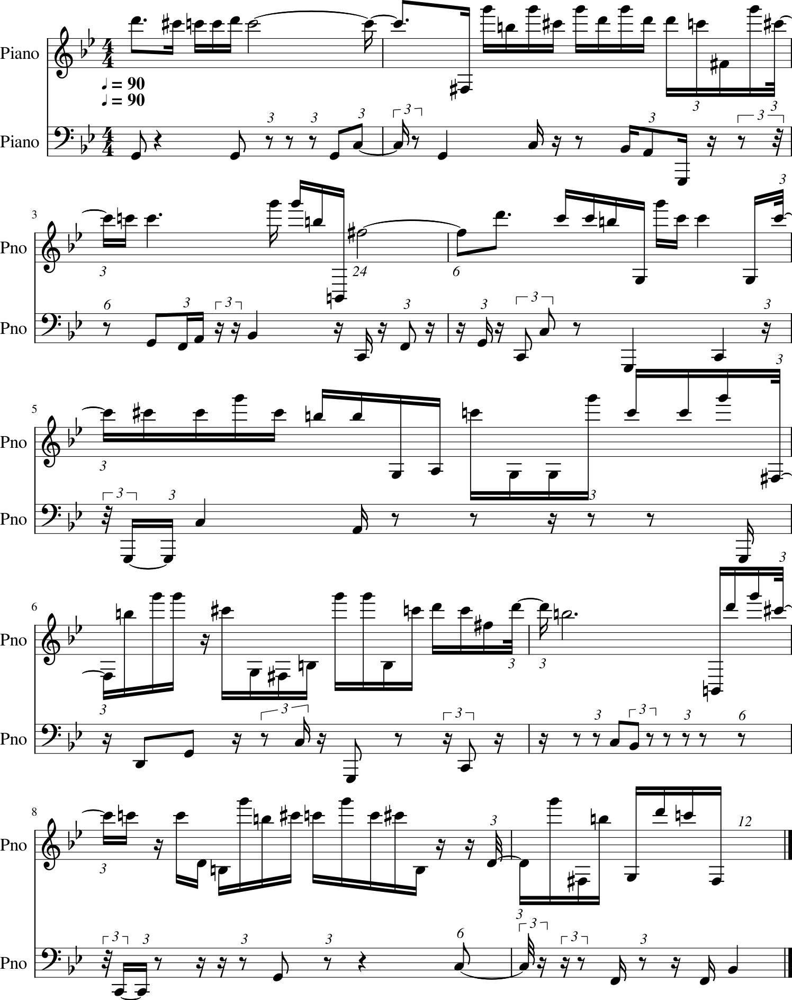

In [117]:
music_generated.show()

## Music Audio

In [121]:
play(music_generated)

# Save Model

In [119]:
import pickle

path = "/content/drive/MyDrive/ClassicalMusic/ModelChopin/"
model_pkl_file = path + "MugenLSTM_tr.pkl"

with open(model_pkl_file, 'wb') as file:
    pickle.dump(lstm_tr, file)


In [120]:
path = "/content/drive/MyDrive/ClassicalMusic/ModelChopin/"
model_pkl_file = path + "MugenLSTM_bs.pkl"

with open(model_pkl_file, 'wb') as file:
    pickle.dump(lstm_bs, file)
